# Explainer Notebook #
This notebook contains the code for the visualizations found on https://clarabrimnesgardner.github.io/, and explanations for design-choices. 

The first two cells are initialization. Note that this notebook have been written in google colab, and therefore the second cell should not be run outside colab.

The datasets used for this project (and in this notebook) can be downloaded through the links below: 

Original data set: https://drive.google.com/open?id=1Maga8JVHM6q7B0u-CDeo448rlloi5LRj  

Data set merged with weather and district numbers: https://drive.google.com/open?id=1yYXSerXNenOewXALccdTHESWc8nA-S-r

Augmented data set divided into districts and distance to schools: https://drive.google.com/open?id=1oCtOSql-88A2IZE-qsgC1h8msEJ_-0zs 

School districts and their coordinates: https://drive.google.com/open?id=1Cd4gwp1wNm6iEJ7tiuMwTTKMJcvKNzp9

School districts with computed number of accidents etc (geojson file): https://drive.google.com/open?id=1gI2QKYbotX1VZPQx19D48fp0d4HMYEh6

Elementary school locations: https://drive.google.com/open?id=1GWKU6XtUGh6qGoPSO2I5qYQOmAfGFzxN

Weather data: https://drive.google.com/open?id=1nVOTK0xs4ut0zqjAEz3b1MvGKFCSWf2T


The datasets above are needed in order to run this notebook. There is however also quite a few computationally heavy cells included to show the steps of the preprocessing. So in order to run this notebook (in a reasonable timeframe) one should load the augmented data sets. Furthermore the bokeh plots will most likely not be preloaded (more likely if the notebook is opened through CoLab), so if you wish to see them without going through the trouble of running the notebook, we will discuss them in the same order as they appear on the website. 


In [0]:
# Loading packages 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Setting plot parameters
plt.style.use('ggplot')
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 10)

In [0]:
# Install geo-packages
!pip install fiona
!pip install geopandas
!pip install shapely

# Code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Loading the data-set
link='https://drive.google.com/open?id=1yYXSerXNenOewXALccdTHESWc8nA-S-r'
fluff, id = link.split('=')
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('Filename.csv')  
data = pd.read_csv('Filename.csv')
data = data.set_index(pd.to_datetime(dataJ['CRASH DATE'] + ' ' + data['CRASH TIME'],format='%m/%d/%Y %H:%M'))

## Motivation

The main data set we have chosen contains information regarding traffic accidents in New York City. It contains approximately 1,5 million incidents from 2012 to 2020. The data set includes geographical/temporal information and the severity of the crashes. We have furthermore more merged the data set with the geographical divisions of school districts in New York and the locations of elementary schools. This allowed us to investigate where and when in New York pupils have a higher risk of being involved in a traffic accident.  

We also included some weather attributes, to investigate how the accidents changes with the weather.

We chose the data set because it contains a lot of information, which makes way for interesting investigations. Furthermore the topic is interesting - traffic accidents is a big killer in New York City (https://www.nytimes.com/2017/05/29/health/car-accidents-child-deaths-seat-belts.html). We chose to merge the data-set with data related to schools, because many children die in traffic accidents (see article above). As children go to school every day it is therefore interesting to see which districts and schools are most dangerous. Furthremore the choice of school district is important in USA - there are websites dedicated to find the districts with the best schools (e.g. https://www.niche.com/k12/search/best-school-districts/m/new-york-city-metro-area/). 


After visiting our website, the user should be able to tell which school districts in New York City, that are most dangerous to live in with respect to car accidents. Furthermore they should know which schools that are the most dangerous within one school district. 

## Basic Statistics


### Data Cleaning and Preprocessing
We used in total four data-sets to create our visualizations. The main data-set is the already described data set about car-crashes in NYC, which can be found at 
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95. 

For data about school districts and school locations we used two data sets. The first one contains information about all school districts in NYC. The most crucial information found here is multipolygon shape, which outlines the shape  of all school-districts in (Latitude,Longitude)-coordinates. The data-set can be found here https://data.cityofnewyork.us/Education/School-Districts/r8nu-ymqj. Note that we downloaded the sub-data-set which only contains elementary school districts. The second data-set contains information about all schools in NYC. The most important information gained from this, is the location of all schools. The data-set can be found at https://data.cityofnewyork.us/Education/2017-2018-School-Locations/p6h4-mpyy. 


At last we also included a data-set about the weather conditions in NYC. The weather data was can be found here https://openweathermap.org/history-bulk. 

Some preprocessing was required for each data-set. In the following cells we will describe and demonstrate, what was done. As some of the operations took quite a long time (up to two days), we have uploaded a cleaned data-set to a google drive which can be accessed. 



#### Cleaning of Car Crashes Data-set
For the main data-set we removed all observations with NaN entries in the Latitude/Longitude columns, as our focus is on geographical patterns. The index was also changed to be the timestamp in date-time format. The code-cell below demonstrates how this was done.


In [0]:
data['FullDate'] = data['CRASH DATE'] + ' ' + data['CRASH TIME'];

data = data.set_index(pd.to_datetime(data['FullDate'],format='%m/%d/%Y %H:%M'))

# Remove Nan 
data = data.dropna(subset = ['LONGITUDE', 'LATITUDE'])

#### Cleaning and Merging of School Districts Data-set
The school districts data-set did not require any cleaning after it was downloaded. To merge it with the car-crashes data-set we found the location of each observation in the car-crashes data-set. For each of these locations we iterated over all school-districts and checked if the district contained the location. The code cell below shows how this was done. Afterwards observations not belonging to a district was removed. The cell below loads the data



In [0]:
import geopandas as gpd
import json

from google.colab import files
uploaded = files.upload()
import io
# Loading data
ny = pd.read_csv(io.BytesIO(uploaded['nysd.csv']))

*WARNING*: It took 24 hours on our computers to run this cell.

In [0]:
# Finding the school district of each observation
data['District'] = 100
data['DistrictNumber'] = 100
# Iterating over the observation
for j in range(0,len(data)):
    # Making a shapely.point with coordinates of accident
    point1 = Point(data['LONGITUDE'][j],data['LATITUDE'][j])
    # Iterating over school districts
    for i in range(0,len(ny)):
            tempDist = ny['geometry'][i]
            # Checking if current district contains current observation
            if tempDist.contains(point1):
                data['District'][j] = i
                data['DistrictNumber'][j] = ny['school_dist'][i]
                break
    if not (j % 1000):
        print(f'{j/len(data)*100} % done')

After having assigned a school district to each observation, the data was summarized in the data-frame with the school districts. In the cells below the number of accidents, injuries and fatalitites is counted for each district. The counts are also divided by the area, to create a more fair measure. At last the accident to injury rate and the accident to fatality rate is found. The cell below demonstrates how to do this.

In [0]:
# Grouping the accidents by district and counting
countDistricts = data.groupby(['District']).size()

# Summing entries for each district and extracting injuries and fatalities
countDistricts2 = data.groupby(['District']).sum()
countDistricts2 = countDistricts2[['NUMBER OF PERSONS INJURED','NUMBER OF PERSONS KILLED']]
countDistricts = countDistricts.rename('Incidents')

# Merging number of accidents and number of injuries/fatalities frames
countDistricts2 = countDistricts2.merge(countDistricts,left_on='District',right_on='District')

# Merging frames with data-frame with details of school districts
ny = ny.merge(countDistricts2,left_on = ny.index, right_on = 'District')
ny = ny.rename(columns = {'NUMBER OF PERSONS INJURED':'Injuries', 'NUMBER OF PERSONS KILLED':'Fatalities'})
ny

#### Cleaning and Merging of School Data
The data-set with the locations of schools was cleaned before it was merged to the main-data-set. As we chose to work with the elementary school districts, we removed all schools, which were not elementary schools. There was one school which had (0,0) as it coordinates, so this was also removed from the data-set. At last the coordinates were changed to the "Point" format, which allowed for easier distance computation. The cell below shows the preprocessing of the schools-data-set. 

In [0]:
from shapely.geometry import Point
uploaded = files.upload()
schools = pd.read_csv(io.BytesIO(uploaded['School_Locations.csv']))

# Extracting elementary schools
schools = schools[schools["LOCATION_CATEGORY_DESCRIPTION"] == "Elementary"]

# Removing school with coordinates (0,0)
schools = schools.drop(1803)

# Saving locations of schools in a shapely.point
schools["PointLoc"] = Point(0,0)
for i in schools.index:
        coords = (schools["Location 1"][i].split("(")[1])
        coord1 = float(coords.split(",")[0])
        coord2 = coords.split(",")[1]
        coord2 = float(coord2.split(")")[0])
        schools["PointLoc"][i] = Point(coord2,coord1)
        if coord1<10:
            print(i)
schools

The location of the schools was included in the main data-set by measuring the distance from the location of every observation to each of the schools in the same school district. That is if an accident took place in school district 1, the distance to all schools in district 1 was measured. The results were saved as list in two additional columns in the data-set. The cell below shows the procedure for the first district

*WARNING*: It took 24+ to run this for all districtcell on our computers

In [0]:
# Selecting data from district 1
data1 = data[data["District"]==1]
data1['SchoolIds'] = [[] for _ in range(len(data1))]
data1['Distances'] = [[] for _ in range(len(data1))]

# Initializing the count with zero
schools_geo['Count'] = 0 
from shapely.geometry import MultiPoint

# Iterating over observations from district 1
for i in range(0,len(data1)):
    # Iterating over schools in district 1
    for j in schools_geo.index:
        if (schools_geo["District"][j] ==1):

            # Saving location of current accident and current school
            p1 = (data1["LONGITUDE"][i], data1["LATITUDE"][i])
            p2 = (schools_geo["Longitude"][j], schools_geo["Latitude"][j])

            # Computing distance in kilometers
            dist = distance.distance(p1,p2).km

            # Appending measured distance to point as well as school id
            schools_geo['Count'][j] = schools_geo['Count'][j]+1
            data1['SchoolIds'][i].append(j)
            data1['Distances'][i].append(dist)
    if not (i % 1000):
            print(f'{i/len(data1)*100} % done')
            
            

#### Loading of preprocessed data-set ####
The preprocessed data-set is uploade to inside under the name "dataSchools". Load it here.


In [0]:
# Loading the data-set with all observations and their distances to schools
link='https://drive.google.com/open?id=1oCtOSql-88A2IZE-qsgC1h8msEJ_-0zs'
fluff, id = link.split('=')
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('Filename.csv')  
data = pd.read_csv('Filename.csv')
data = data.set_index(pd.to_datetime(data['CRASH DATE'] + ' ' + data['CRASH TIME'],format='%m/%d/%Y %H:%M'))

In [0]:
data.head().T

,2015-06-25 00:05:00,2015-06-21 08:00:00,2015-06-18 20:20:00,2015-06-21 19:00:00,2015-06-24 08:45:00
CRASH DATE,06/25/2015,06/21/2015,06/18/2015,06/21/2015,06/24/2015
CRASH TIME,0:05,8:00,20:20,19:00,8:45
BOROUGH,BROOKLYN,BROOKLYN,BROOKLYN,BROOKLYN,BROOKLYN
ZIP CODE,11221,11221,11207,11207,11237
LATITUDE,40.6922,40.6898,40.6879,40.6832,40.7065
LONGITUDE,-73.9148,-73.9147,-73.9072,-73.9071,-73.9309
LOCATION,POINT (-73.9147535 40.6921641),POINT (-73.9146988 40.6898365),POINT (-73.9072372 40.6878902),POINT (-73.9071247 40.6832295),POINT (-73.9308936 40.7065136)
ON STREET NAME,PUTNAM AVENUE,JEFFERSON AVENUE,COOPER STREET,GRANITE STREET,KNICKERBOCKER AVENUE
CROSS STREET NAME,CENTRAL AVENUE,EVERGREEN AVENUE,CENTRAL AVENUE,BUSHWICK AVENUE,HARRISON PLACE
OFF STREET NAME,NaN,NaN,NaN,NaN,NaN


Furthermore a preprocessed data-set which includes the number of accidents, injuries and fatalities - both normalized with the area of the district. It also includes the injury-rate and the fatality rate

In [0]:
# import geopandas as gpd
import json

from google.colab import files
uploaded = files.upload()
import io

# Loading data
ny2 = gpd.read_file(io.BytesIO(uploaded['nygjson.geojson']))

# Making an integer value of school districts.
ny2['school_distInt'] = ny2['school_dist']
ny2['school_dist'] = [float(i) for i in ny2.school_dist]
ny2 = ny2.sort_values(by='school_dist')

#### Loading and prepocessing weather data ####
The weather data-set can be found [here](https://drive.google.com/open?id=15eR-mqQuiH9JGlBH1-U8P-KcSAL9icll) and is loaded here.

In [0]:
# Loading the weather data-set
link='https://drive.google.com/file/d/15eR-mqQuiH9JGlBH1-U8P-KcSAL9icll/view?usp=sharing'
id = link.split('=')
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('Filename.csv')  
weather = pd.read_csv('Filename.csv')

We assume that children usually are dropped of at school between 6 am and 9 am in the morning at picked up again between 2 pm and 4 pm. The amount of rain in these period each day is saved for later. 

In [0]:
weather = pd.read_csv("weatherNYC.csv")
weather['dt_iso'] = [x[:-19] for x in weather['dt_iso']]
weather = weather.set_index(pd.to_datetime(weather['dt_iso'],format='%Y-%m-%d'))
weather2 = weather.between_time('00:06:00', '00:09:00').append(weather.between_time('00:14:00', '00:16:00'))
features_fill = ['rain_1h']
weather[features_fill] = weather[features_fill].fillna(0)
weather2 = weather.groupby(weather.index)['rain_1h'].sum()
weather = weather2.to_frame()

### Explorative Analysis ### 
We initiated our analysis with creating a number of plots showing the basic statistics of the data-sets. We started out by investigating the geographical patterns of the accidents. Below is one of the first iterations of how the accidents are distributed in space and where the fatal accidents take place. 

This later evolved into the maps seen on the website where the school districts are colored according to the counts in the second data set, which makes it easier to grasp whats going on. 

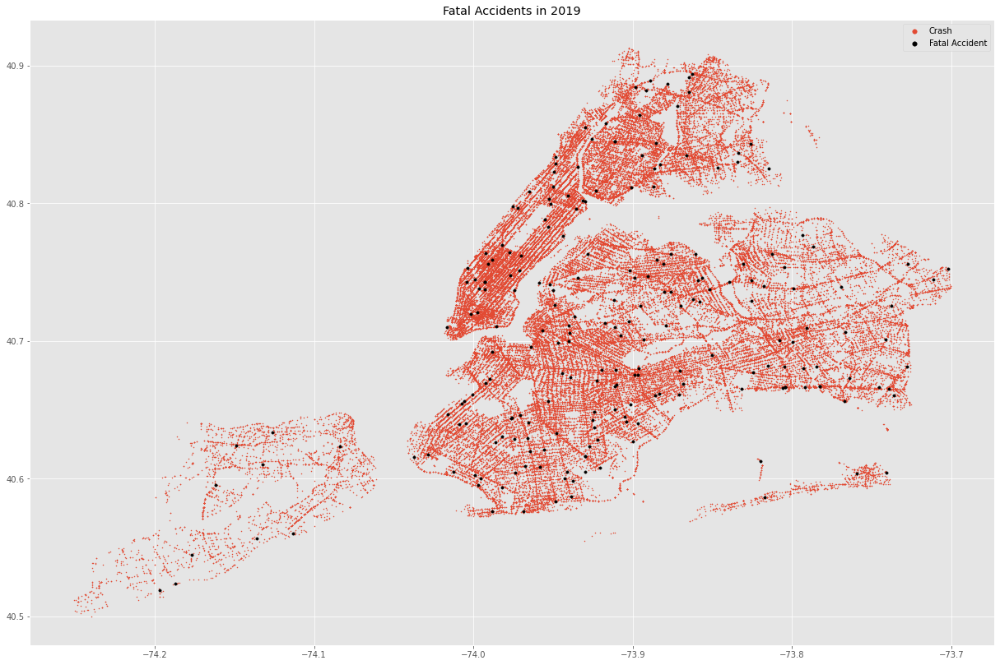

In [0]:
data1=data

# Choosing only data from 2019
data1=data['2019']

# Setting borders for latitude and longtude. Sample 10000 points. 
datatmp=data1[(data1['LATITUDE']>39) & (data1['LATITUDE']<41) & (data1['LONGITUDE']<-50) & (data1['LONGITUDE']>-74.4)].sample(100000)
datatmp1=data1[(data1['LATITUDE']>39) & (data1['LATITUDE']<41) & (data1['LONGITUDE']<-50) & (data1['LONGITUDE']>-74.4)]
plt.figure(figsize = (21,14))
# Plottting crashes
plt.scatter(datatmp['LONGITUDE'], datatmp['LATITUDE'], s=1,label='Crash');

# Plotting the crashes which resulted in a fatality in another color.
plt.scatter(datatmp1[datatmp1['NUMBER OF PERSONS KILLED']>0]['LONGITUDE'], datatmp1[datatmp1['NUMBER OF PERSONS KILLED']>0]['LATITUDE'], s=11,color='black',label='Fatal Accident');
lgnd = plt.legend(scatterpoints=1, fontsize=10)
lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
plt.title('Fatal Accidents in 2019')
plt.show()

We also explored the temporal pattern in a 24 hour window in relation to the 'causes' of the crashes. This yielded the expected results in regards to rush hour and alcohol involvement happening at night. In the end we chose to not dive into the reasons why the crashes happened but rather when, where and how dangerous they were.

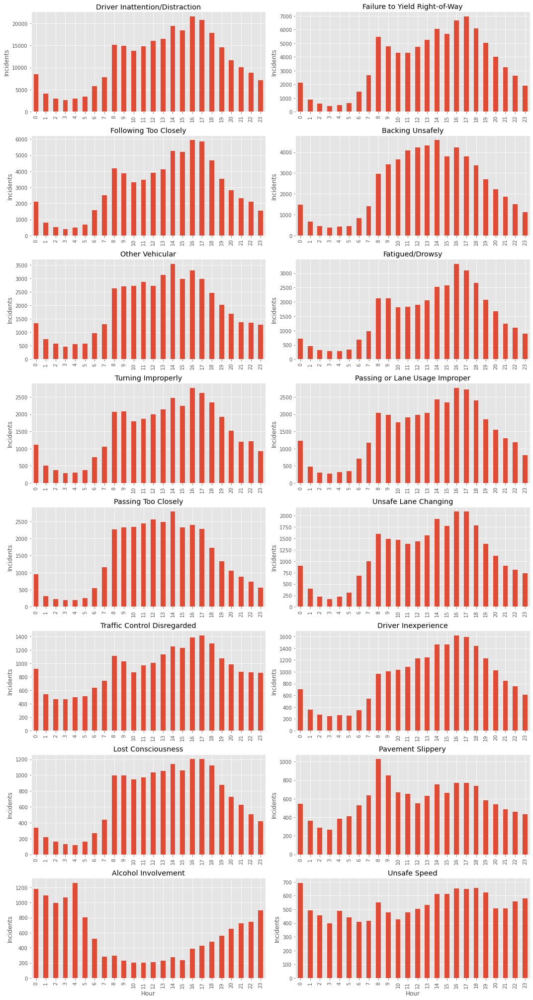

In [0]:
reasonList = ["Driver Inattention/Distraction","Failure to Yield Right-of-Way","Following Too Closely","Backing Unsafely","Other Vehicular","Fatigued/Drowsy", "Turning Improperly","Passing or Lane Usage Improper","Passing Too Closely","Unsafe Lane Changing","Traffic Control Disregarded","Driver Inexperience","Lost Consciousness","Pavement Slippery","Alcohol Involvement","Unsafe Speed"]
plt.figure(figsize=(15, 28))
j = 0
for reason in reasonList:
    # Extracing data belonging to current category
    datatmp = data[data["CONTRIBUTING FACTOR VEHICLE 1"] ==reason]
    # Grouping it by the week day
    datatmpSize = datatmp.groupby(datatmp.index.hour).size()
    plt.subplot(8,2,j+1)
    datatmpSize.plot(kind='bar')
    plt.title(reason)
   
    if (j == 14 or j ==15):
        plt.xlabel('Hour')
    else:
        plt.xlabel('')
    plt.ylabel('Incidents')
    j = j + 1
plt.tight_layout()
plt.show()

We also considered looking at dangerous intersections. While this is interesting we could not find any obvious ways to include this on our website.

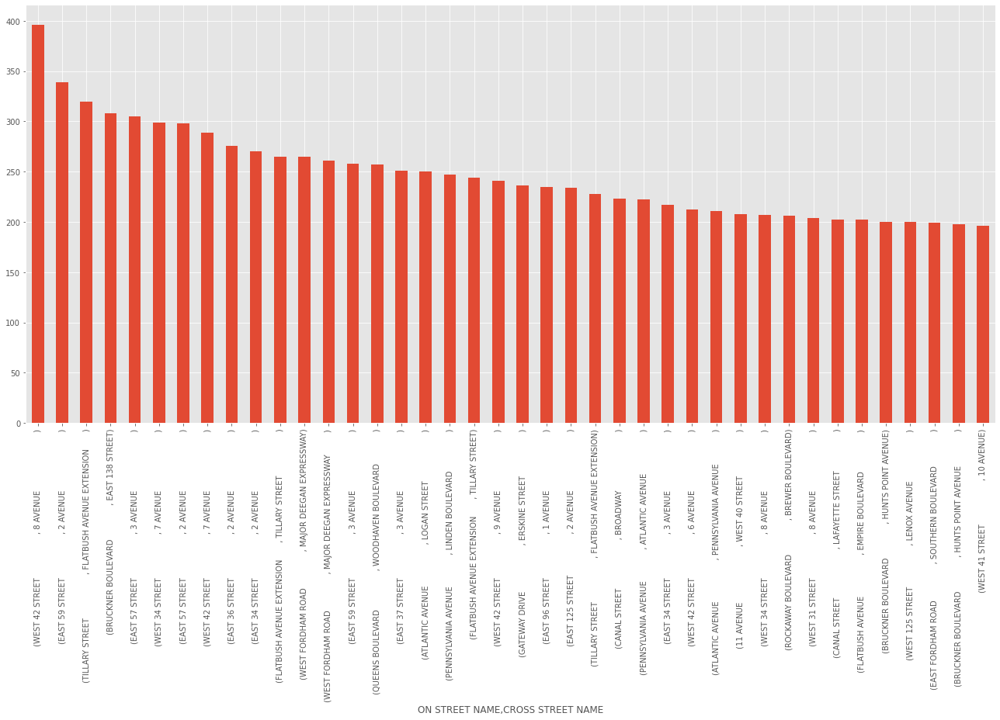

In [0]:
tmp=data.dropna(subset = ['ON STREET NAME', 'CROSS STREET NAME'])
plt.figure(figsize=(18,13))
tmp.groupby(['ON STREET NAME','CROSS STREET NAME']).size().nlargest(40).plot(kind='bar')

plt.tight_layout()

## Data Analysis

#### Geographical Patterns
Our data-analysis was mostly concerned with geographical patterns. The plot below shows the distribution of accidents across the school districts. The number of accidents, injuries and fatalities has been normalized with the area to create a more fair measure. Our attention was quicly drawn to the high number of accidents in school district 2. This turned out to be a rather larger district covering most of Manhattan.




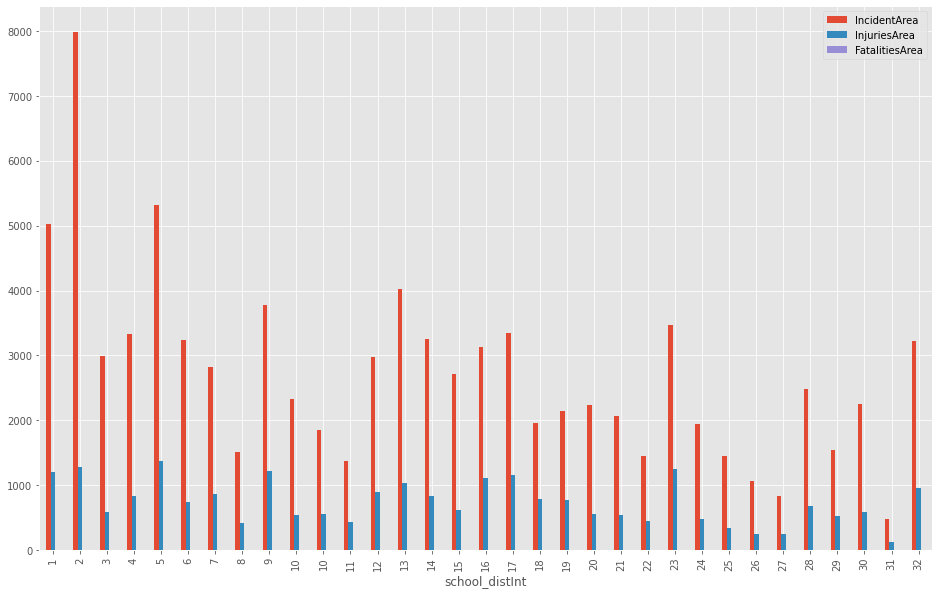

In [0]:
ny2Plot = ny2.set_index('school_distInt')
ny2Plot[['IncidentArea','InjuriesArea','FatalitiesArea']].plot(kind='bar');

We also wanted to investigate the seriousness of the accidents. This we did by investigating the percentage of accidents which ended up in an injury or a fatality. Investigating these to plots showed us that the serious accidents did not necessarily happen at the same places, where many accidents happened. 

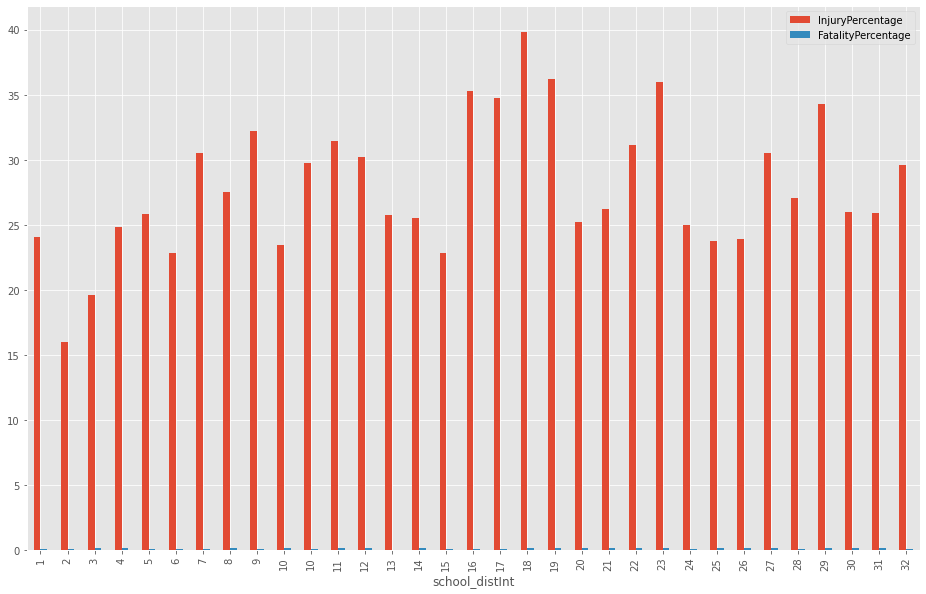

In [0]:
ny2Plot[['InjuryPercentage','FatalityPercentage']].plot(kind='bar')

### Predictions
We wanted to include some predictions in our project. As we have concentrated on count-data it seemed appropriate to apply a model based on the Poisson-distribution, which is well suited for count-data. The predictions are based on a generalized linear model with the Poisson-distribution as probabilistic model. \\

We counted the number of accidents with a 250m radius of each school in the considered school districts and happening between 6 am and 8 am and between 2 pm and 4 pm as it would be times where children are arriving and leavning shcool. Wheather it was raining in this period of time or not was also noted.

The model takes the form:
$$\log(E(Y|x))=\alpha+\beta x,$$
where $x$ is whether it rains or not and $Y$ is the accident count. The prediction is then given by:
$$E(Y|x)=e^{\alpha+\beta x}$$
The output is the probability that one or more accidents happens in a given day between 8-19 AM or between 2-4 PM within the 250 m radius of each school. A gml is fitted for each school in each district using the python package statsmodels.api.




## Genre

Most of our visualizations can be characterized as an annotated graph/map. 


Going through the three categories of Visual Narrative:

__Visual Structuring:__ 
Visual structure communicate the overall structure of the narrative to the user and should help the user to get an overview of the visualizations. For visual structuring we used a consistent visual platform as it only changes the content within one visualization at a time. This makes the website manageble as we guide the user through the different visualizations and thereby makes it easier for the user to navigate. 

__Highligthing:__ 
Highlighthing helps the user navigate in a particular display and focuses their attention. Here we chose close ups and zooming to let the users consider seperate districts. We also chose feature distinction to e.g. consider temporal data or weather. When turning to the focus districts we present a map with the focus-districts higlighted, such that the user can turn to this for reference.

__Transition Guidance:__
Transition Guidance helps the user navigate between the different visualizations. Here object Continuity and Viewing Angle is is used as e.g. severel of the visualizations have the same background. 



Going through the three categories of Narrative Structure:

__Ordering:__
Ordering is to the path viewers take through the visualization. Here the path is prescribed by us, i.e. the ordering is linear, as the users interacts with the visualizations as the user scroll down the website. 

__Interactivity__
Interativity is the different ways a user can can manipulate the visualization and how the user learns the methods. Here filtering, selection and navigation is choosen explained by explicit instructions and initial cofiguration. 

__Messaging__
Messaging is the way the visualization communicates observations and results to the viewer. Here labels and captions on the visualizations are used together with introduction and summeri text associated with visualization. We have tried to write the text such that it encourages the reader to explore the interactivity.


## Visualizations 

We chose to primarily work with Bokeh because of the ability to export the figures to html and because of the versatility of the library. Especially regarding the making of interactive plots. 

Our visualizations are primarily rooted in the geographical patterns of the data sets. The first two are choropleth maps, which gives a nice and quick overview of the important differences in the data we wish show. 

Once the geographical patterns are clear, we move on to exploring the temporal patterns of the data set. Firstly the entire timeline of the entire data set is presented with the ability to zoom and pan through the accidents over time. Furthermore a smoothing of the data is applied in the form of a rolling mean. This gives the viewer the opportunity to easily grasp the trends of the temporal data. After we have established an overview, we return to the frame of the school dsitricts in the form of a clickable map. By clicking on school districts, that perhaps had been of interest in the previous plots, the viewer can explore at what time of day (week, month and year) the most accidents happen. This further expands the ongoing story of how traffic accidents are distributed across New York City, both in time and by school district.

We then zoom in on a few particular school districts and investigate the accidents near the schools within these districts. For each school within the districts, the number of accidents that has happened within a radius of 250 meter is counted. We judged that this distance would be appropriate for producing a number that would correlate well with the danger the pupils are exposed to when coming to and from school. 
This is visualized on a map, where the schools are drawn with a radius colored according to the number of accident that has happened within that radius. Furthermore a fraction of the accidents that took place in the district is sampled and plotted to further motivate the difference between the schools in terms of danger. 




In [0]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure, show, output_file
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter
from bokeh.palettes import brewer


from bokeh.layouts import row
from bokeh.models import ColumnDataSource, CustomJS, TapTool
from bokeh.models import Panel, Tabs, Legend
from bokeh.models import ColumnDataSource, Label, LabelSet, Range1d, Text
from bokeh.io.doc import curdoc
from bokeh.models import Slider, HoverTool, Select
from bokeh.layouts import widgetbox, row, column
output_notebook()

ny_json = json.loads(ny2.to_json())

# Convert to json preferred string-like object 
json_data = json.dumps(ny_json)
geosource = GeoJSONDataSource(geojson = json_data)

The first plot of the website is created below. It is a cloropleth map of the school districts colored based on the amount of accidents, injuries and fatalities by area of the school districts.

In [0]:
def make_plot1(field_name,verbage):    

  # Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette = palette, low =min([float(i) for i in np.array(ny2[field_name])]), high = max([float(i) for i in np.array(ny2[field_name])]))

  # Create color bar.
    format_tick = NumeralTickFormatter(format='0.0')
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=18, formatter=format_tick,
    border_line_color=None, location = (0, 0))

    p = figure(title = verbage + ' by Area', 
             plot_height = 650, plot_width = 850,
             toolbar_location = None,tools="")
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.axis.visible = False

  # Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource, fill_color = {'field' : field_name, 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
  
  # Specify color bar layout.
    p.add_layout(color_bar, 'right')

  # Add the hover tool to the graph
    p.add_tools(hover)
    return p

In [0]:
from bokeh.models import Panel, Tabs
from bokeh.palettes import viridis
output_notebook()
# Define a sequential multi-hue color palette.
palette = brewer['YlGnBu'][9]

# Reverse color order so that dark blue is highest obesity.
palette = palette[::-1]

# Add hover tool
hover = HoverTool(tooltips = [ ('District','@school_dist'),
                               ('Accidents','@Incidents{,}'),
                               ('Injuries', '@Injuries{,}'),
                               ('Fatalities', '@Fatalities{,}')
                             ])


input_field1 ='IncidentArea'
input_field2 = 'InjuriesArea'
input_field3 = "FatalitiesArea"

# Call the plotting function
p1 = make_plot1(input_field1, 'Accidents')
tab1 = Panel(child=p1, title="Accidents")
p2 = make_plot1(input_field2, 'Injuries')
tab2 = Panel(child=p2, title="Injuries")
p3 = make_plot1(input_field3, 'Fatalities')
tab3 = Panel(child=p3, title="Fatalities")
tabs = Tabs(tabs=[ tab1, tab2, tab3])

show(tabs)
output_file("CloroplethIncidents.html")

The next plot of the website is also a cloropleth map where the injrury and fatality rate of the school districts are plotted. This gives an indication of where the most dangerous accidents happen.

In [0]:
def make_plot_Rate(field_name,injfat):    
  # Set the format of the colorbar
    palette = brewer['YlGnBu'][9]
    # Reverse color order so that dark blue is highest obesity.
    palette = palette[::-1]
  # Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette = palette, low = float(min(ny2[field_name])), high =max([float(i) for i in np.array(ny2[field_name])]))
  # Create color bar.
    format_tick = NumeralTickFormatter(format='0.00')
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=18, formatter=format_tick,
    border_line_color=None, location = (0, 0))

  # Create figure object.
    #format_df.loc[format_df['field'] == field_name, 'verbage'].iloc[0]
    
    p = figure(title = 'Percentage of accidents where someone '+injfat, 
             plot_height = 600, plot_width = 900,tools='')
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.axis.visible = False

  # Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource, fill_color = {'field' : field_name, 'transform' : color_mapper},line_color = 'black', line_width = 0.25, 
              fill_alpha = 1,nonselection_fill_color={'field' : field_name, 'transform' : color_mapper},nonselection_fill_alpha=1,selection_color="firebrick",nonselection_line_alpha=1.0,nonselection_line_color='black')
    #p.patches('xs','ys', source = geosource, fill_color = 'white', line_color = 'black', line_width = 0.25, fill_alpha = 1)
  # Specify color bar layout.
    p.add_layout(color_bar, 'right')

  # Add the hover tool to the graph
    #p.add_tools(hover)
    return p

In [0]:



hover1 = HoverTool(tooltips = [                               ('','@InjuryPercentage{0.00 a} %')
                             ])

hover2 = HoverTool(tooltips = [                               ('', '@FatalityPercentage %')
                            ])

input_field1 ='InjuryPercentage'
input_field2 = 'FatalityPercentage'



# Call the plotting function
p1 = make_plot_Rate(input_field1,'was injured')
p1.add_tools(hover1)
p1.toolbar.logo = None
p1.toolbar_location = None
tab1 = Panel(child=p1, title="Injuries")
p2 = make_plot_Rate(input_field2,'died')
p2.add_tools(hover2)
p2.toolbar.logo = None
p2.toolbar_location = None
tab2 = Panel(child=p2, title="Fatalities")

tabs = Tabs(tabs=[ tab1, tab2])

show(tabs)
output_file("CloroplethRates.html")

The next plot is the timeseries of the entire dataset, before we dive into the temporal patterns of the districts. This plot gives an overview of the general trend of traffic accidents in New York. Overall there seems to be a decline, when we look at the 365 day rolling mean.

In [0]:
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, RangeTool
#group data by date
OTA = data.groupby([data.index.date]).size()



TimeY = OTA.tolist()
#smoothe data
rollmeanY7 = OTA.rolling(7).mean().tolist()
rollmeanY30 = OTA.rolling(30).mean().tolist()
rollmeanY365 = OTA.rolling(365).mean().tolist()

#create upper figure
p = figure(title='Number of Accidents Over Time',plot_height = 470, plot_width = 900,x_axis_type="datetime", x_axis_location="above",x_range=(OTA.index[1000], OTA.index[1500]),tools="",toolbar_location=None,background_fill_color="white",background_fill_alpha=0.2)
sp = p.line(x='x',  y='y', source=  ColumnDataSource({'x': OTA.index.tolist(), 'y': TimeY, 'date': [OTA.index.tolist()[i].strftime('%Y-%m-%d') for i in range(len(OTA))]}),line_color='firebrick',line_alpha=0.8)

#add rolling means
rm7 = p.line(x='x',  y='y', source=  ColumnDataSource({'x': OTA.index.tolist(), 'y': rollmeanY7, 'date': [OTA.index.tolist()[i].strftime('%Y-%m-%d') for i in range(len(OTA))]}),line_color='blue',line_width=1,muted_line_alpha=0,muted=True)
rm30 = p.line(x='x',  y='y', source=  ColumnDataSource({'x': OTA.index.tolist(), 'y': rollmeanY30, 'date': [OTA.index.tolist()[i].strftime('%Y-%m-%d') for i in range(len(OTA))]}),line_color='green',line_width=2,muted_line_alpha=0,muted=False)
rm365 = p.line(x='x',  y='y', source=  ColumnDataSource({'x': OTA.index.tolist(), 'y': rollmeanY365, 'date': [OTA.index.tolist()[i].strftime('%Y-%m-%d') for i in range(len(OTA))]}),line_color='magenta',line_width=2,muted_line_alpha=0,muted=True)

#hover tool
hover6 = HoverTool(tooltips = [('Accidents','@y'),('Date','@date')],mode='vline',renderers=[sp])
p.add_tools(hover6)

legend2 = Legend(items=[("7 day rolling mean" , [rm7]),("30 day rolling mean" , [rm30]),("365 day rolling mean" , [rm365])], location='top_right')
p.add_layout(legend2)
p.legend.click_policy="mute"
p.yaxis.axis_label = 'Accidents'

#lower plot that can be selected and dragged
select = figure(title="Drag the middle and edges of the selection box to change the range above",
                plot_height=130, plot_width=900, y_range=p.y_range,
                x_axis_type="datetime", y_axis_type=None,
                tools="", toolbar_location=None, background_fill_color="white")

range_tool = RangeTool(x_range=p.x_range)
range_tool.overlay.fill_color = "navy"
range_tool.overlay.fill_alpha = 0.2

select.line(x='x',  y='y', source=  ColumnDataSource({'x': OTA.index.tolist(), 'y': TimeY, 'date': [OTA.index.tolist()[i].strftime('%Y-%m-%d') for i in range(len(OTA))]}),line_color='firebrick',line_alpha=0.5)
select.ygrid.grid_line_color = None
select.add_tools(range_tool)
select.toolbar.active_multi = range_tool
output_file('TimeSeries.html')
show(column(p, select))


The next plot is the interactive plot of the districts and temporal patterns. The map shows the different districts and by clicking on a district the distribution over time is shown against the overall distribution

In [0]:
dfHour = pd.DataFrame()
#group data by hour and district
for i in range(1,33):
    tmp = data[data['DistrictNumber']==i]
    tmp = tmp.groupby([tmp.index.hour]).size()
    dfHour[str(i)] = tmp/sum(tmp)

dfHour = dfHour.T

In [0]:
dfWeek = pd.DataFrame()
#group data by week day and district
for i in range(1,33):
    tmp = data[data['DistrictNumber']==i]
    tmp = tmp.groupby([tmp.index.weekday]).size()
    dfWeek[str(i)] = tmp/sum(tmp)

dfWeek = dfWeek.T

In [0]:
dfMonth = pd.DataFrame()
#group data by month and district 
for i in range(1,33):
    tmp = data[data['DistrictNumber']==i]
    tmp = tmp.groupby([tmp.index.month]).size()
    dfMonth[str(i)] = tmp/sum(tmp)

dfMonth = dfMonth.T

In [0]:
dfYear = pd.DataFrame()
#group data by year and district
for i in range(1,33):
    tmp = data[data['DistrictNumber']==i]
    tmp = tmp['2013':'2019']
    tmp = tmp.groupby([tmp.index.year]).size()
    dfYear[str(i)] = tmp/sum(tmp)

dfYear = dfYear.T

In [0]:
#group for all districts
dfHourTotal = data.groupby(data.index.hour).size()/len(data)
dfWeekTotal = data.groupby(data.index.weekday).size()/len(data)
dfMonthTotal = data.groupby(data.index.month).size()/len(data)
dfYearTotal = data['2013':'2019'].groupby(data['2013':'2019'].index.year).size()/len(data['2013':'2019'])

In [0]:
#aggregate data monthly
dfTime = pd.DataFrame()
for i in range(1,33):
    tmp = data[data['DistrictNumber']==i]
    tmp = tmp['2012':'2019']
    tmp = tmp.groupby([tmp.index.year,tmp.index.month]).size()
    dfTime[str(i)] = tmp
dfTime = dfTime.set_index(pd.to_datetime([str(dfTime.index[i][0])+'-'+str(dfTime.index[i][1]) for i in range(len(dfTime))],format='%Y-%m'))
dfTime = dfTime.T

In [0]:
def make_plot_nocolor(field_name):    


    p = figure(title = 'The Temporal Behaviour of Districts (toggle districts by clicking on them)', 
             plot_height = 600, plot_width = 800,tools='tap')
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.axis.visible = False



  # Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource, fill_color = '#a1dab4',line_color = 'black', line_width = 0.25, 
              fill_alpha = 1,nonselection_fill_color='#a1dab4',nonselection_fill_alpha=1,selection_color="firebrick",nonselection_line_alpha=1.0,nonselection_line_color='black')

    return p

In [0]:
from bokeh.models import Panel, Tabs
from bokeh.models import ColumnDataSource, Label, LabelSet, Range1d, Text

#make map
plot1 = make_plot_nocolor('IncidentArea')

#making sure the grouped data is formatted correctly
lines_y = dfHour.values.tolist()
lines_y1 = dfWeek.values.tolist()
lines_y2 = dfMonth.values.tolist()
lines_y3 = dfYear.values.tolist()

lines_y4 = dfTime.values.tolist()

#create bar plots
plot2 = figure(title='Accidents by Time of Day',plot_height = 250, plot_width = 800,tools="")
bar0 = plot2.vbar(x='x',  top='y', source= ColumnDataSource({'x': np.arange(0,24), 'y': dfHourTotal}),width=0.8,fill_color='#a1dab4')
lines = plot2.vbar(x='x',  top='y', source=  ColumnDataSource({'x': np.arange(0,24), 'y': lines_y[0]}),width=0.8,fill_color='firebrick',alpha=0.6)

plot3 = figure(title='Accidents by Day of Week',plot_height = 250, plot_width = 800,tools="")
bar1 = plot3.vbar(x='x',  top='y', source= ColumnDataSource({'x': np.arange(0,7), 'y': dfWeekTotal}),width=0.8,fill_color='#a1dab4')
lines1 = plot3.vbar(x='x',  top='y', source=  ColumnDataSource({'x': np.arange(0,7), 'y': lines_y1[0]}),width=0.8,fill_color='firebrick',alpha=0.6)

plot4 = figure(title='Accidents by Month',plot_height = 250, plot_width = 800,tools="")
bar2 = plot4.vbar(x='x',  top='y', source= ColumnDataSource({'x': np.arange(1,13), 'y': dfMonthTotal}),width=0.8,fill_color='#a1dab4')
lines2= plot4.vbar(x='x',  top='y', source=  ColumnDataSource({'x': np.arange(1,13), 'y': lines_y2[0]}),width=0.8,fill_color='firebrick',alpha=0.6)

plot5 = figure(title='Accidents by Year',plot_height = 250, plot_width = 800,tools="")
bar3 = plot5.vbar(x='x',  top='y', source= ColumnDataSource({'x': np.arange(2013,2020), 'y': dfYearTotal}),width=0.8,fill_color='#a1dab4')
lines3= plot5.vbar(x='x',  top='y', source=  ColumnDataSource({'x': np.arange(2013,2020), 'y': lines_y3[0]}),width=0.8,fill_color='firebrick',alpha=0.6)

plot6 = figure(title='Number of accidents over time',plot_height = 250, plot_width = 800,x_axis_type="datetime",tools=['wheel_zoom','reset'])
lines4 = plot6.line(x='x',  y='y', source=  ColumnDataSource({'x': dfTime.columns.to_list(), 'y': lines_y4[0], 'date': [dfTime.columns.tolist()[i].strftime('%Y-%m') for i in range(dfTime.shape[1])]}),line_color='firebrick')



lines.visible = False
lines1.visible = False
lines2.visible = False
lines3.visible = False
lines4.visible = False

#axis settings for the plots
plot2.yaxis.axis_label = "Accident Frequency"
plot2.xaxis.axis_label = "Hour"
plot2.xaxis.ticker = np.arange(0,24)
plot2.yaxis[0].formatter = NumeralTickFormatter(format="0.00")

legend2 = Legend(items=[("All Districts" , [bar0])], location='top_left', orientation="horizontal")
plot2.add_layout(legend2)


plot3.yaxis.axis_label = "Accident Frequency"
plot3.xaxis.axis_label = "Weekday"
plot3.xaxis.major_label_overrides = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
plot3.yaxis[0].formatter = NumeralTickFormatter(format="0.00")

plot4.yaxis.axis_label = "Accident Frequency"
plot4.xaxis.axis_label = "Month"
plot4.xaxis.ticker = np.arange(1,13)
plot4.xaxis.major_label_overrides = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
plot4.yaxis[0].formatter = NumeralTickFormatter(format="0.00")

plot5.yaxis.axis_label = "Accident Frequency"
plot5.xaxis.axis_label = "Year"
plot5.yaxis[0].formatter = NumeralTickFormatter(format="0.00")

tabs = Tabs(tabs=[Panel(child=plot2, title="Hourly"), Panel(child=plot3, title="Weekly"), Panel(child=plot4, title="Monthly"),Panel(child=plot5, title="Yearly"),Panel(child=plot6, title="Over Time")])
#callback and tap code
code = '''if (cb_data.source.selected.indices.length > 0){
            lines.visible = true;
            lines1.visible = true;
            lines2.visible = true;
            lines3.visible = true;
            lines4.visible = true;
            selected_index = cb_data.source.selected.indices[0];
            lines.data_source.data['y'] = lines_y[selected_index]
            lines.data_source.change.emit(); 
            lines1.data_source.data['y'] = lines_y1[selected_index]
            lines1.data_source.change.emit(); 
            lines2.data_source.data['y'] = lines_y2[selected_index]
            lines2.data_source.change.emit(); 
            lines3.data_source.data['y'] = lines_y3[selected_index]
            lines3.data_source.change.emit(); 
            lines4.data_source.data['y'] = lines_y4[selected_index]
            lines4.data_source.change.emit();
          }'''


plots = column(plot1, tabs)
plot1.select(TapTool).callback = CustomJS(args = {'lines': lines, 'lines_y': lines_y, 'lines1': lines1, 'lines_y1': lines_y1, 'lines2': lines2, 'lines_y2': lines_y2,'lines3': lines3, 'lines_y3': lines_y3,'lines4': lines4, 'lines_y4': lines_y4}, code = code)
plot1.toolbar.logo = None
plot1.toolbar_location = None

hover1 = HoverTool(tooltips = [('District','@school_dist')])
plot1.add_tools(hover1)

hover6 = HoverTool(tooltips = [('Accidents','@y'),('Year-Month','@date')],mode='vline')
plot6.add_tools(hover6)

plot2.toolbar.logo = None
plot2.toolbar_location = None

plot3.toolbar.logo = None
plot3.toolbar_location = None

plot4.toolbar.logo = None
plot4.toolbar_location = None

plot5.toolbar.logo = None
plot5.toolbar_location = None

output_file("ClickTabMap.html")
show(plots)




Next we created a plot of the school location and counted every accident that happened within a radius of 250m. 

In [0]:
# Function to prepare data-set for district plotting by converting saved files to right list format
def prepDataDistrictPlot(district,distance):
    pd.options.mode.chained_assignment = None
    # Choosing right district 
    dataTemp = data[data["DistrictNumber"]==district]

    # Splitting the saved list at commas
    dataTemp['Distances']=[dataTemp['Distances'][i][1:-1].split(',') for i in range(len(dataTemp))]
    dataTemp['SchoolIds']=[dataTemp['SchoolIds'][i][1:-1].split(',') for i in range(len(dataTemp))]
    schools['Counts'] = 0
    dataTemp['DistancesFloat'] = [[] for _ in range(len(dataTemp))]

    # Iterating over all length of list
    for i in range(0,len(dataTemp)):
        for j in range(0,len(dataTemp['Distances'][i])):

            # Converting to fload and appending to list
            dist = (float(dataTemp['Distances'][i][j][:]))
            dataTemp['DistancesFloat'][i].append(dist)

            # Checking if distance is smaller than input distance 
            if dist <distance:
                idx = int(dataTemp['SchoolIds'][i][j])
                schools['Counts'][idx] = schools['Counts'][idx] + 1
        if not (i % 1000):
            print(f'{i/len(dataTemp)*100} % done')
    
    schoolsTemp = schools[schools['Counts']>0]
    return dataTemp, schoolsTemp

The function is run for school district 1:

In [0]:
data1, schools1 = prepDataDistrictPlot(1,0.5)

0.0 % done
6.093473889464383 % done
12.186947778928767 % done
18.280421668393153 % done
24.373895557857534 % done
30.467369447321918 % done
36.560843336786306 % done
42.65431722625069 % done
48.74779111571507 % done
54.84126500517945 % done
60.934738894643836 % done
67.02821278410822 % done
73.12168667357261 % done
79.21516056303699 % done
85.30863445250138 % done
91.40210834196576 % done
97.49558223143013 % done


In [0]:
data5, schools5 = prepDataDistrictPlot(1,0.5)
data18, schools18 = prepDataDistrictPlot(1,0.5)
data21, schools21 = prepDataDistrictPlot(1,0.5)
data28, schools26 = prepDataDistrictPlot(1,0.5)

Below the code for making the plots of the schools in the five focus-districts is given. For some reason this would not run in collab, and therefore the plot is not given in this explainer-notebook. We refer to the web-page.

In [0]:
# Function to make plot of districts. Note that district should be input as a string 
def makePlot(data1,schools1,district):
    # Correcting index of data1 
    from geopandas import GeoDataFrame

    # Preparing locations of accidents and sampling 5000 accidents
    data1 = data1.set_index([pd.Index(range(0,len(data1)))])
    data1["PointLoc"] = [Point(data1["LONGITUDE"][i],data1["LATITUDE"][i]) for i in range(0,len(data1))]
    data1 = data1.sample(5000)
    data1_geo  = GeoDataFrame(data1, geometry="PointLoc")
    data_json1 = json.loads(data1_geo.to_json())
    json_data1 = json.dumps(data_json1)
    geosource1 = GeoJSONDataSource(geojson = json_data1)

    # Preparing data-set which holds shapes of districts
    ny1 = ny[ny['school_dist']==district]
    ny_json1 = json.loads(ny1.to_json())
    json_ny1 = json.dumps(ny_json1)
    geosourceny1 = GeoJSONDataSource(geojson = json_ny1)
    
    # Preparing data-set which has locations of schools
    schools_geo1 = GeoDataFrame(schools1, geometry="PointLoc")
    schools_json1 = json.loads(schools_geo1.to_json())
    json_schools1 = json.dumps(schools_json1)
    geosourceschools1 = GeoJSONDataSource(geojson = json_schools1)
    
    from bokeh.models import Panel, Tabs
    from bokeh.palettes import viridis
    palette = brewer['YlGnBu'][9]

    # Reverse color order so that dark blue is highest obesity.
    palette = palette[::-1]

    # Setting hower tool
    TOOLTIPS = [
    ('School', "@LOCATION_NAME"),
    ('Counts', "@Counts")
    ]
    field_name = 'Counts'
    plot = figure(title = "Schools in District in "+district , 
             plot_height = 650, plot_width = 850,tools=["box_zoom","reset","wheel_zoom"])
    format_tick = NumeralTickFormatter(format="0")

    color_mapper = LinearColorMapper(palette = palette, low =min(schools1['Counts']),high = max(schools1['Counts']))
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=18, formatter=format_tick,border_line_color=None, location = (0,0))

    # Plotting the districts
    plot.patches('xs','ys', source = geosourceny1, fill_color = '#a1dab4',
          line_color = 'black', line_width = 0.25, fill_alpha = 0.5)
    
    # Adding opaque circles. Radius found by trial and error
    plot.circle(x='x',y='y',radius = 0.0045, color={'field' : field_name,'transform' : color_mapper}, alpha=0.5,source = geosourceschools1)
    # Plotting locations of schools
    schoolcircle=plot.circle(x='x',y='y',size = 10, color='black', alpha=0.7,source = geosourceschools1)
    # Restricting hower tool to locations of schools
    hover = HoverTool(renderers=[schoolcircle])
    hover.tooltips=TOOLTIPS
    plot.add_tools(hover)
    # Adding locations of sampled accidents
    plot.circle(x='x',y='y',size=1, color='red', alpha=0.7,source = geosource1)
    plot.add_layout(color_bar, 'right')
    

    plot.xaxis.visible=False
    plot.yaxis.visible=False

    plot.xgrid.grid_line_color = None
    plot.ygrid.grid_line_color = None


    show(plot)
    return plot

In [0]:
# Creating the plots and saving them is in one plot 
p1 = makePlot(data1,schools1,'1')
p5 = makePlot(data5,schools1,'5')
p18 = makePlot(data18,schools1,'18')
p21 = makePlot(data21,schools1,'21')
p26 = makePlot(data26,schools1,'26')

from bokeh.models.widgets import Panel, Tabs
output_file("DistTabsSample.html")
tab1 = Panel(child=p1, title="District 1")
tab5 = Panel(child=p5, title="District 5")
tab18 = Panel(child=p18, title="District 18")
tab21 = Panel(child=p21, title="District 21")
tab26 = Panel(child=p26, title="District 26")
tabs = Tabs(tabs=[ tab1, tab5, tab18, tab21, tab26 ])
show(tabs)

Last we created a plot of the predictions on the probability of an accident is going to happen within a radius of 250m from a school in the drop off (6am to 8am) and pick up (2pm and 4 pm) time dependent on if it is raining or not. The first data prepares the data for prediction for a given district. The second function makes the predictions using generalized linear model. 

In [0]:
import statsmodels.api as sm

# function to prepare data from a given district to predictions
def prepDataDistrictPredictions(districtData,distance,weather):
    # only concider accidents between 6 and 8 am and between 2 and 4 pm
    dataTemp = districtData.between_time('00:06:00', '00:08:00').append(districtData.between_time('00:14:00', '00:16:00'))
    dataTemp = dataTemp.set_index(pd.to_datetime(dataTemp['CRASH DATE'],format='%m/%d/%Y'))

    # construct an output dataframe
    date1 = '2012-07-01'
    date2 = '2020-03-24'
    dataOut = pd.DataFrame(pd.date_range(date1, date2))
    dataOut = dataOut.set_index(pd.to_datetime(dataOut[:][0],format='%m/%d/%Y'))

    # with a column for each school
    distance = 0.5
    schools = dataTemp['SchoolIds'][0] 
    for i in range(0,len(schools)):
        dataOut[schools[i]] = 0
    dataOut['rain'] = 0
    dataOut = dataOut.drop(dataOut.columns[[0]], axis=1) 

    # for all accidents in time frame 
    for j in range(0,len(dataTemp)):
      for i in range(0,len(dataOut)):
        weath = weather.loc[dataOut.index[i]][0]
        # note if it is raining or not
        if weath > 0.0:
            dataOut['rain'][i] = 1
        # assign accident to correct date
        if dataOut.index[i] == dataTemp.index[j]:
          dists   = dataTemp['DistancesFloat'][j]
          # for the schools within the distance 
          for k in range(0,len(schools)):
            if dists[k] < distance:
                dataOut[schools[k]][i] += 1
    
    return dataOut

# function creating predictions for schools in given district 
def predictions(predData,schools):
  col = predData.columns
  n = len(col)
  pred_rain = []
  pred_noRain = []

  # for each school
  for i in range(0,n-1):
    # exstract data for given school
    dataPredict = pd.DataFrame(columns = ["obs"])
    dataPredict["obs"] = predData[col[i]]
    dataPredict["rain"] = predData[col[n-1]]

    # if any accidents happened close to school
    if len(dataPredict["obs"].unique()) > 1:
      # built model
      model = sm.formula.glm("obs ~ C(rain, Treatment(reference=0))",
                           family=sm.families.Poisson(), data=dataPredict).fit()

      df_test_1 = pd.DataFrame({"rain": [1]})
      df_test_0 = pd.DataFrame({"rain": [0]})
      # predict based on rain/no rain
      pred_rain.append(model.predict(df_test_1)[0])
      pred_noRain.append(model.predict(df_test_0)[0])
    else:
      pred_rain.append(0)
      pred_noRain.append(0)

  df = pd.DataFrame(list(zip(pred_rain, pred_noRain,schools['LOCATION_NAME'])), columns =['rain', 'no rain','schools'])
  df.set_index('schools')
  
  return df

The predictions is done for for five focus districts:

In [0]:
predData1 = prepDataDistrictPredictions(data1,0.5,weather)
pred1 = predictions(predData1)
predData5 = prepDataDistrictPredictions(data5,0.5,weather)
pred5 = predictions(predData5)
predData18 = prepDataDistrictPredictions(data18,0.5,weather)
pred18 = predictions(predData18)
predData1 = prepDataDistrictPredictions(data21,0.5,weather)
pred21 = predictions(predData21)
predData1 = prepDataDistrictPredictions(data26,0.5,weather)
pred26 = predictions(predData26)

The predictions are exported to R. Here the probability of one or more accidents happening are calculated. The predicted probabilities can be found [here](https://drive.google.com/open?id=1U8yUW3ebL7snCe625vkPaaOivSZchkGB). It should be downloaded and uploaded to proceed. 

The predictions for the selected district are gathering in the following visualization:

In [0]:
pred1 = pd.read_csv("pred1.csv")
pred5 = pd.read_csv("pred5.csv")
pred18 = pd.read_csv("pred18.csv")
pred21 = pd.read_csv("pred21.csv")
pred26 = pd.read_csv("pred26.csv")

In [0]:
# function creating bar plot for predictions in given school district
def createPredictPlot(pred1):
  products = pred1["schools"].to_list()
  months = ['Rain','No Rain']
  sales = {'products':products,
           'rain':pred1["ProbRain"].to_list(), 
           'norain':pred1["ProbNoRain"].to_list()}
  fig = figure(x_range = products, plot_width = 800, plot_height = 600)
  # bar plot of prediction given rain
  bar1 = fig.vbar(x = dodge('products', -0.15, range = fig.x_range), top = 'rain',
     width = 0.2,source = sales, color = '#a1dab4', legend_label="Rain")
  # bar plot of prediction given no rain
  bar2 = fig.vbar(x = dodge('products', 0.15, range = fig.x_range), top = 'norain',
     width = 0.2, source = sales,color = '#41b6c4', legend_label="No Rain")

  fig.xaxis.major_label_orientation = math.pi/2.5
  fig.yaxis.axis_label = 'Probability'
  # make hovers
  hover1 = HoverTool(tooltips = [('','@rain{0.000} %')],renderers=[bar1])
  hover2 = HoverTool(tooltips = [('','@norain{0.000} %')],renderers=[bar2])
  fig.toolbar_location = None

  fig.add_tools(hover1)
  fig.add_tools(hover2)

  return fig

In [0]:
p1 = createPredictPlot(pred1)
tab1 = Panel(child=p1, title="District 1")

p2 = createPredictPlot(pred5)
tab2 = Panel(child=p2, title="District 5")

p3 = createPredictPlot(pred18)
tab3 = Panel(child=p3, title="District 18")

p4 = createPredictPlot(pred21)
tab4 = Panel(child=p4, title="District 21")

p5 = createPredictPlot(pred26)
tab5 = Panel(child=p5, title="District 26")

tabs = Tabs(tabs=[ tab1, tab2, tab3, tab4, tab5])

show(tabs)

We see that the probability of an accident is at most 0.02 which corresponds to 2%. The probabilities are highest in district 1 and 5. If you compare the different districts, it is interesting to notice the influence of rain. In the most urban districts (1 and 5) the probability of accidents doesn’t depend on the weather, while many schools in district 18 have a higher accident probability when it is raining.

## Discussion 

The investigations of the geographical patterns went well. We think we found some interesting patterns (e.g. more accidents in the urban-areas, but more serious accidents in less urban-areas). Regarding the temporal analysis we found some un-expected patterns (e.g. the overall dive in April 2016). The investigations of each of the focus-districts revaled some differences with respect to the safety of the schools, which we also found interesting. At last the (lack) of influence of the rain found in the predictions, was interesting, as we had expected rain to be a significant risk factor. 

What could be improved and is still missing is probably to make the analysis even more relevant to worried parents. This could for instance be done by pointing out dangerous places in each school district. We could also have made clear if the persons getting injured or dying were walking, cycling or inside a car, to find the safest modes of transportation in each district. 

## Contributions 
Below we have listed each group member and the parts of the assignment they were responsible for.

Clara Brimnes Gardner(s153542): Setting up website, merging data-sets concering school districts and schools, cloropleth maps of counts and rates, plots showing the differences between each school district.

Jon Roslyng Larsen (s154358): Setting up website, initial data-analysis, explorative analysis, plots showing temporal patterns, ensuring consistent layout of plots.

Sara Dorthea Nielsen (s153173): Initial data-analysis, explorative analysis, merging weather data-set, predictions, plot showing predictions, genre.